In [1]:
# Standard Library
import os
import time

# Data Handling & Utilities
import numpy as np
import pandas as pd

# Machine Learning / Metrics
from sklearn.preprocessing import normalize  # untuk L2-normalisasi
from sklearn.metrics.pairwise import cosine_similarity

# PyTorch & Computer Vision
import torch
from torchvision import models, transforms
from PIL import Image
from tqdm import tqdm

# Visualization
import matplotlib.pyplot as plt
import matplotlib.patches as patches


data_dir = "D:\\Trade-Off_CBIR\\dataset\\Corel-1K"
data_dir_GHIM = "D:\\Trade-Off_CBIR\\dataset\\GHIM-10K"

print("Classes available (Corel-1K):", os.listdir(data_dir))
print("Classes available (GHIM-10K):", os.listdir(data_dir_GHIM))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Classes available (Corel-1K): ['africans', 'beaches', 'buildings', 'buses', 'dinosaurs', 'elephants', 'flowers', 'food', 'horses', 'mountains']
Classes available (GHIM-10K): ['aircraft', 'buildings', 'butterfly', 'cars', 'dragon fly', 'fireworks', 'flowers', 'hen', 'horses', 'insects', 'motorcycles', 'mountains', 'sea shores', 'ships', 'sunset', 'temples', 'trees', 'valleys', 'walls', 'yacht']
Using device: cuda


## Tahap 1: Ekstraksi Fitur

In [4]:
import torch
from torchvision import transforms
import timm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ======================================================
# Model 1: MLP-Mixer Small (patch 16), random init
# ======================================================
mlp_mixer = timm.create_model('mixer_s16_224', pretrained=False)
mlp_mixer = torch.nn.Sequential(*list(mlp_mixer.children())[:-1])  # Hapus classifier
mlp_mixer = mlp_mixer.to(device).eval()

# ======================================================
# Model 2: ResMLP-12, pretrained
# ======================================================
res_mlp = timm.create_model('resmlp_12_224', pretrained=True)
res_mlp = torch.nn.Sequential(*list(res_mlp.children())[:-1])
res_mlp = res_mlp.to(device).eval()

# ======================================================
# Model 3: gMLP-Small, pretrained
# ======================================================
gmlp = timm.create_model('gmlp_s16_224', pretrained=True)
gmlp = torch.nn.Sequential(*list(gmlp.children())[:-1])
gmlp = gmlp.to(device).eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/61.4M [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/77.7M [00:00<?, ?B/s]

## Tahap 2: Pre-trained Models

In [5]:
import time
import torch
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# ======================================================================
# Measure inference speed untuk 3 model MLP (MLP-Mixer, ResMLP, gMLP)
# ======================================================================
def measure_inference_speed(model, sample_img, transform, device='cuda'):
    model.eval()
    img_t = transform(sample_img).unsqueeze(0).to(device)

    if device == 'cuda':
        torch.cuda.synchronize()
    start = time.time()

    with torch.no_grad():
        # Untuk MLP-based model, cukup panggil forward biasa
        _ = model(img_t)

    if device == 'cuda':
        torch.cuda.synchronize()
    end = time.time()
    return end - start

# ======================================================================
# Measure embedding metrics (tidak berubah)
# ======================================================================
def measure_embedding_metrics(features, labels):
    start = time.time()
    sims = cosine_similarity(features, features)
    search_time = time.time() - start

    inter_dists = []
    classes = list(set(labels))
    for i, cls_i in enumerate(classes):
        idx_i = [k for k,l in enumerate(labels) if l == cls_i]
        for j, cls_j in enumerate(classes):
            if i >= j:
                continue
            idx_j = [k for k,l in enumerate(labels) if l == cls_j]
            inter_dists.append(np.mean(sims[np.ix_(idx_i, idx_j)]))

    intra_dists = []
    for cls in classes:
        idx = [k for k,l in enumerate(labels) if l == cls]
        intra_dists.append(np.mean(sims[np.ix_(idx, idx)]))

    return search_time, np.mean(inter_dists), np.mean(intra_dists)

In [7]:
import os
import numpy as np
from PIL import Image
from tqdm import tqdm
import torch
from sklearn.preprocessing import normalize
import torch.nn.functional as F

# ===============================================================
# Ekstraksi path & label gambar
# ===============================================================
img_paths = []
labels = []

for cls in os.listdir(data_dir):
    cls_path = os.path.join(data_dir, cls)
    for f in os.listdir(cls_path):
        img_paths.append(os.path.join(cls_path, f))
        labels.append(cls)

# ===============================================================
# Ekstraksi fitur semua model MLP
# ===============================================================
mlp_mixer_features = []
resmlp_features    = []
gmlp_features      = []

for path in tqdm(img_paths, desc="Extracting MLP Features"):
    img = Image.open(path).convert('RGB')
    img_t = transform(img).unsqueeze(0).to(device)  # pyright: ignore

    with torch.no_grad():
        # ===========================
        # MLP-Mixer
        # ===========================
        v1 = mlp_mixer(img_t)
        if v1.dim() > 2:
            v1 = F.adaptive_avg_pool2d(v1, 1)
        v1 = torch.flatten(v1, 1)  # shape: (1, dim)
        mlp_mixer_features.append(v1.cpu().numpy())

        # ===========================
        # ResMLP
        # ===========================
        v2 = res_mlp(img_t)
        if v2.dim() > 2:
            v2 = F.adaptive_avg_pool2d(v2, 1)
        v2 = torch.flatten(v2, 1)
        resmlp_features.append(v2.cpu().numpy())

        # ===========================
        # gMLP
        # ===========================
        v3 = gmlp(img_t)
        if v3.dim() > 2:
            v3 = F.adaptive_avg_pool2d(v3, 1)
        v3 = torch.flatten(v3, 1)
        gmlp_features.append(v3.cpu().numpy())

# ===============================================================
# Convert ke numpy array & L2-normalisasi
# ===============================================================
mlp_mixer_features = normalize(np.vstack(mlp_mixer_features))
resmlp_features    = normalize(np.vstack(resmlp_features))
gmlp_features      = normalize(np.vstack(gmlp_features))

print("Feature extraction completed:")
print("MLP-Mixer:", mlp_mixer_features.shape)
print("ResMLP   :", resmlp_features.shape)
print("gMLP     :", gmlp_features.shape)

Extracting MLP Features:   0%|          | 0/1000 [00:00<?, ?it/s]

Extracting MLP Features: 100%|██████████| 1000/1000 [00:31<00:00, 31.95it/s]

Feature extraction completed:
MLP-Mixer: (1000, 1)
ResMLP   : (1000, 1)
gMLP     : (1000, 1)


## Tahap 3: Image Retrieval & Similarity Matching

In [9]:
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# ======================================================================
# Fungsi retrieve top-K berdasarkan cosine similarity (tetap sama)
# ======================================================================
def retrieve(query_feat, all_feats, top_k=10):
    sims = cosine_similarity([query_feat], all_feats)[0]  # pyright: ignore[reportArgumentType]
    idxs = np.argsort(sims)[::-1][:top_k]
    return idxs

# ======================================================================
# Fungsi evaluasi Recall@K & Precision@K per kelas (tetap sama)
# ======================================================================
def evaluate_recall_precision(features, labels, top_k=10):
    classes = sorted(list(set(labels)))
    results = []

    for cls in classes:
        # indeks query untuk kelas tertentu
        idxs_cls = [i for i, l in enumerate(labels) if l == cls]
        R_list, P_list = [], []

        for q in idxs_cls:
            retrieved_idx = retrieve(features[q], features, top_k)
            retrieved_labels = [labels[i] for i in retrieved_idx]

            # Recall = jumlah retrieved benar / total data kelas
            R = retrieved_labels.count(cls) / len(idxs_cls)
            # Precision = jumlah retrieved benar / top_k
            P = retrieved_labels.count(cls) / top_k

            R_list.append(R)
            P_list.append(P)

        results.append([cls, np.mean(R_list), np.mean(P_list)])

    df = pd.DataFrame(results, columns=['Class','R','P'])
    
    # Tambahkan row Mean keseluruhan
    mean_row = {
        'Class': 'Mean',
        'R': df['R'].mean(),
        'P': df['P'].mean()
    }
    df = pd.concat([df, pd.DataFrame([mean_row])], ignore_index=True)
    
    # Format angka 4 desimal
    df['R'] = df['R'].astype(float).map("{:.4f}".format)
    df['P'] = df['P'].astype(float).map("{:.4f}".format)

    return df

# ======================================================================
# Contoh pemanggilan untuk top 3 MLP models
# ======================================================================
features_dict = {
    'MLP-Mixer': mlp_mixer_features,
    'ResMLP': resmlp_features,
    'gMLP': gmlp_features
}

df_mlp_mixer = evaluate_recall_precision(mlp_mixer_features, labels)
df_resmlp    = evaluate_recall_precision(resmlp_features, labels)
df_gmlp      = evaluate_recall_precision(gmlp_features, labels)


## Tahap 4: Evaluasi

In [10]:
# ======================================================================
# Fungsi ukur inference speed untuk MLP
# ======================================================================
def measure_inference_speed(model, sample_img, transform, device='cuda'):
    model.eval()
    img_t = transform(sample_img).unsqueeze(0).to(device)
    if device=='cuda':
        torch.cuda.synchronize()
    start = time.time()
    
    with torch.no_grad():
        # MLP: cukup panggil forward biasa
        _ = model(img_t)
    
    if device=='cuda':
        torch.cuda.synchronize()
    end = time.time()
    return end - start

# ======================================================================
# Fungsi ukur embedding metrics (tidak berubah)
# ======================================================================
def measure_embedding_metrics(features, labels):
    start = time.time()
    sims = cosine_similarity(features, features)
    search_time = time.time() - start
    
    inter_dists = []
    classes = list(set(labels))
    for i, cls_i in enumerate(classes):
        idx_i = [k for k,l in enumerate(labels) if l==cls_i]
        for j, cls_j in enumerate(classes):
            if i >= j:
                continue
            idx_j = [k for k,l in enumerate(labels) if l==cls_j]
            inter_dists.append(np.mean(sims[np.ix_(idx_i, idx_j)]))
    
    intra_dists = []
    for cls in classes:
        idx = [k for k,l in enumerate(labels) if l==cls]
        intra_dists.append(np.mean(sims[np.ix_(idx, idx)]))
    
    return search_time, np.mean(inter_dists), np.mean(intra_dists)

# ======================================================================
# Ambil sample image
# ======================================================================
sample_img = Image.open(img_paths[0]).convert('RGB')

# ======================================================================
# Ukur inference speed untuk top 3 MLP
# ======================================================================
mlp_mixer_time = measure_inference_speed(mlp_mixer, sample_img, transform, str(device))
resmlp_time    = measure_inference_speed(res_mlp, sample_img, transform, str(device))
gmlp_time      = measure_inference_speed(gmlp, sample_img, transform, str(device))

# ======================================================================
# Ukur embedding metrics
# ======================================================================
mlp_mixer_search, mlp_mixer_inter, mlp_mixer_intra = measure_embedding_metrics(mlp_mixer_features, labels)
resmlp_search, resmlp_inter, resmlp_intra       = measure_embedding_metrics(resmlp_features, labels)
gmlp_search, gmlp_inter, gmlp_intra           = measure_embedding_metrics(gmlp_features, labels)

# ======================================================================
# Buat DataFrame hasil metrics
# ======================================================================
df_metrics = pd.DataFrame({
    'Model': ['MLP-Mixer', 'ResMLP', 'gMLP'],
    'Inference speed (s/img)': [mlp_mixer_time, resmlp_time, gmlp_time],
    'Embedding search time (s)': [mlp_mixer_search, resmlp_search, gmlp_search],
    'Inter-class dist': [mlp_mixer_inter, resmlp_inter, gmlp_inter],
    'Intra-class dist': [mlp_mixer_intra, resmlp_intra, gmlp_intra]
})

display(df_metrics)

,Model,Inference speed (s/img),Embedding search time (s),Inter-class dist,Intra-class dist
0,MLP-Mixer,0.061362,0.003021,2.292311e-20,1.429062e-19
1,ResMLP,0.058602,0.002647,3.845422e-01,5.081200e-01
2,gMLP,0.118639,0.002141,-2.602666e-02,4.714000e-01


In [11]:
import pandas as pd

# ======================================================================
# Evaluasi CBIR / Retrieval menggunakan top 3 MLP
# ======================================================================
df_mlp_mixer = evaluate_recall_precision(mlp_mixer_features, labels)
df_resmlp    = evaluate_recall_precision(resmlp_features, labels)
df_gmlp      = evaluate_recall_precision(gmlp_features, labels)

# ======================================================================
# Membuat tabel per kelas
# ======================================================================
df_table = pd.DataFrame()
df_table['Class'] = sorted(list(set(labels)))  # daftar kelas unik

# MLP-Mixer
df_table['MLP-Mixer R'] = df_mlp_mixer['R'].astype(float)
df_table['MLP-Mixer P'] = df_mlp_mixer['P'].astype(float)

# ResMLP
df_table['ResMLP R'] = df_resmlp['R'].astype(float)
df_table['ResMLP P'] = df_resmlp['P'].astype(float)

# gMLP
df_table['gMLP R'] = df_gmlp['R'].astype(float)
df_table['gMLP P'] = df_gmlp['P'].astype(float)

# ======================================================================
# MEAN per kolom
# ======================================================================
mean_row = {
    'Class': 'Mean',
    'MLP-Mixer R': df_table['MLP-Mixer R'].mean(),
    'MLP-Mixer P': df_table['MLP-Mixer P'].mean(),
    'ResMLP R': df_table['ResMLP R'].mean(),
    'ResMLP P': df_table['ResMLP P'].mean(),
    'gMLP R': df_table['gMLP R'].mean(),
    'gMLP P': df_table['gMLP P'].mean(),
}

df_table = pd.concat([df_table, pd.DataFrame([mean_row])], ignore_index=True)

# ======================================================================
# Format angka 4 desimal (setelah semua mean dihitung)
# ======================================================================
for col in df_table.columns[1:]:
    df_table[col] = df_table[col].map("{:.4f}".format)

# Tampilkan tabel
display(df_table)


,Class,MLP-Mixer R,MLP-Mixer P,ResMLP R,ResMLP P,gMLP R,gMLP P
0,africans,0.0000,0.0000,0.0022,0.0220,0.0000,0.0000
1,beaches,0.0046,0.0460,0.0000,0.0000,0.0000,0.0000
2,buildings,0.0104,0.1040,0.0000,0.0000,0.0000,0.0000
3,buses,0.0107,0.1070,0.0900,0.9000,0.0000,0.0000
4,dinosaurs,0.0426,0.4260,0.0000,0.0000,0.0910,0.9100
5,elephants,0.0039,0.0390,0.0000,0.0000,0.0900,0.9000
6,flowers,0.0090,0.0900,0.0000,0.0000,0.0000,0.0000
7,food,0.0000,0.0000,0.0468,0.4680,0.0000,0.0000
8,horses,0.0120,0.1200,0.0000,0.0000,0.0000,0.0000
9,mountains,0.0100,0.1000,0.0096,0.0960,0.0067,0.0670


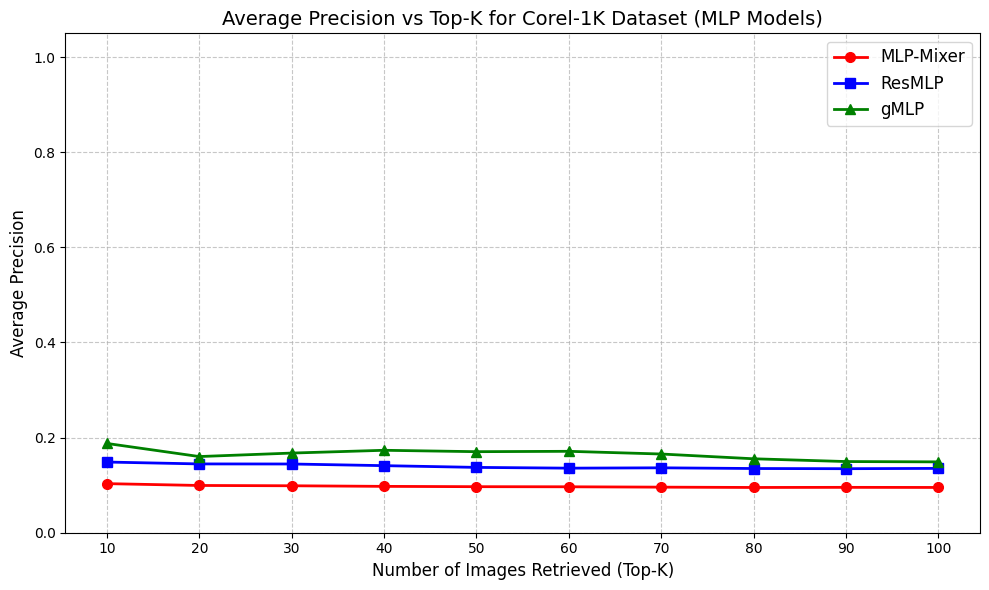

In [12]:
def average_precision_vs_topk(features_list, labels, top_k_max=100):
    top_ks = list(range(10, top_k_max + 1, 10))
    avg_prec = {name: [] for name in features_list}

    # Hitung Average Precision untuk setiap Top-K
    for top_k in top_ks:
        for name, feats in features_list.items():
            df = evaluate_recall_precision(feats, labels, top_k=top_k)
            df['P'] = df['P'].astype(float)  # pastikan kolom Precision float
            avg_prec[name].append(df['P'].mean())

    plt.figure(figsize=(10, 6))

    # Marker dan warna per model
    markers = {
        'MLP-Mixer': 'o',
        'ResMLP': 's',
        'gMLP': '^'
    }

    colors = {
        'MLP-Mixer': 'red',
        'ResMLP': 'blue',
        'gMLP': 'green'
    }

    # Plot Average Precision vs Top-K
    for name in features_list:
        plt.plot(top_ks, avg_prec[name],
                 marker=markers.get(name, 'o'),
                 color=colors.get(name, 'black'),
                 linestyle='-',
                 linewidth=2,
                 markersize=7,
                 label=name)

    plt.xlabel("Number of Images Retrieved (Top-K)", fontsize=12)
    plt.ylabel("Average Precision", fontsize=12)
    plt.title("Average Precision vs Top-K for Corel-1K Dataset (MLP Models)", fontsize=14)
    plt.xticks(top_ks)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(fontsize=12)
    plt.ylim(0, 1.05)
    plt.tight_layout()
    plt.show()

# Dictionary fitur MLP terbaru
features_dict = {
    'MLP-Mixer': mlp_mixer_features,
    'ResMLP': resmlp_features,
    'gMLP': gmlp_features
}

# Jalankan evaluasi dan plot
average_precision_vs_topk(features_dict, labels, top_k_max=100)


In [13]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def show_topk_cbir(features, labels, img_paths, top_k=4, model_name="Model"):
    classes = sorted(list(set(labels)))

    for cls in classes:
        # ambil 1 query per kelas
        idxs_cls = [i for i, l in enumerate(labels) if l == cls]
        query_idx = idxs_cls[0]  # bisa diubah untuk beberapa query

        # retrieve top-K
        retrieved_idx = retrieve(features[query_idx], features, top_k)

        plt.figure(figsize=(15, 3))
        plt.suptitle(f"{model_name} - Query Class: {cls}", fontsize=14)

        # Query image
        query_img = Image.open(img_paths[query_idx]).convert('RGB')
        plt.subplot(1, top_k + 1, 1)
        plt.imshow(query_img)
        plt.axis('off')
        plt.title("Query", fontsize=10)
        plt.gca().add_patch(patches.Rectangle(
            (0, 0), query_img.width, query_img.height,
            edgecolor='blue', fill=False, linewidth=3
        ))

        # Retrieved images
        for i, idx in enumerate(retrieved_idx):
            img = Image.open(img_paths[idx]).convert('RGB')
            plt.subplot(1, top_k + 1, i + 2)
            plt.imshow(img)
            plt.axis('off')
            # warna hijau jika benar, merah jika salah
            color = 'green' if labels[idx] == cls else 'red'
            plt.gca().add_patch(patches.Rectangle(
                (0, 0), img.width, img.height,
                edgecolor=color, fill=False, linewidth=3
            ))
            plt.title(labels[idx], fontsize=9)

        plt.tight_layout()
        plt.show()


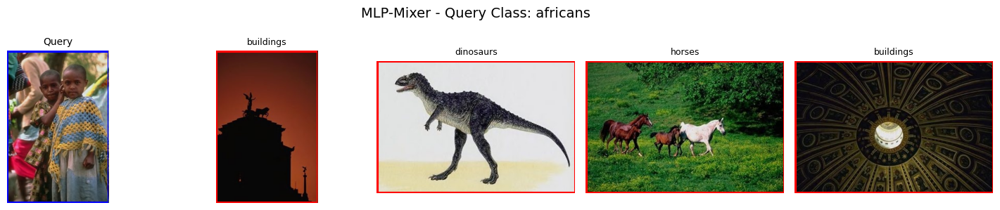

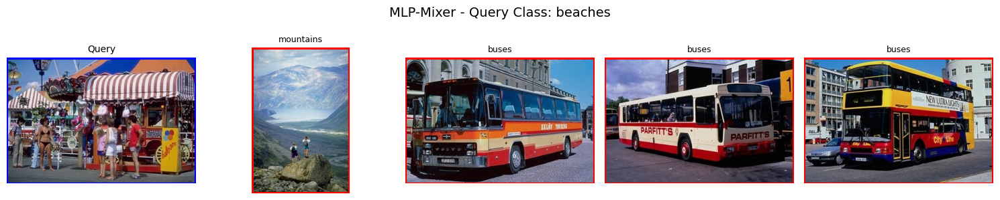

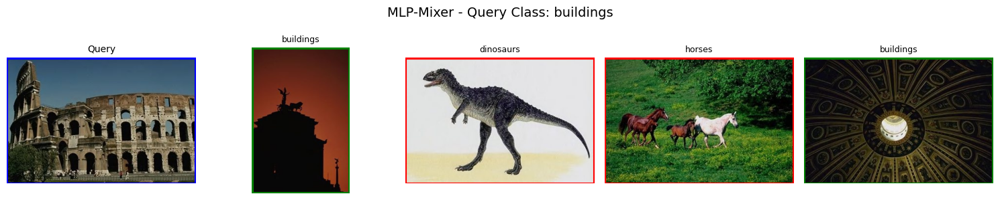

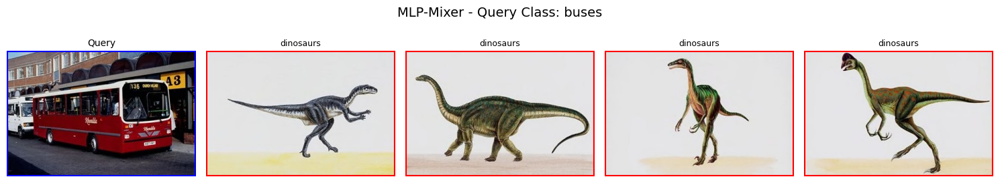

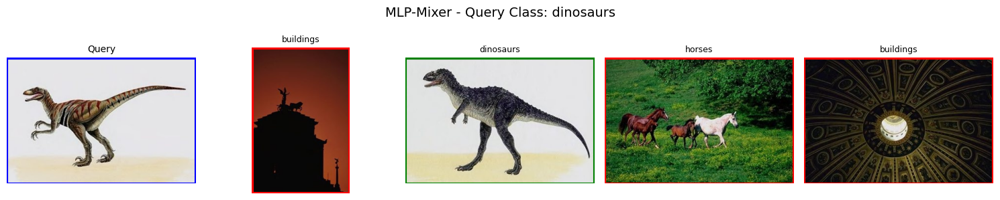

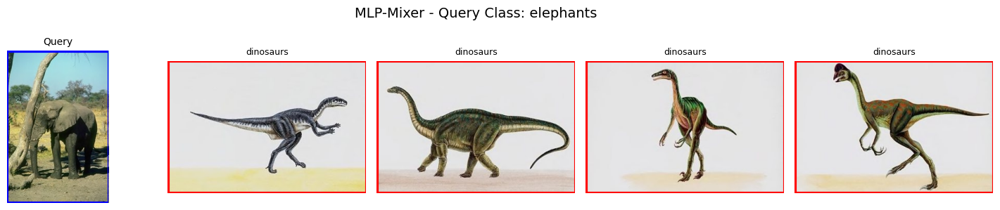

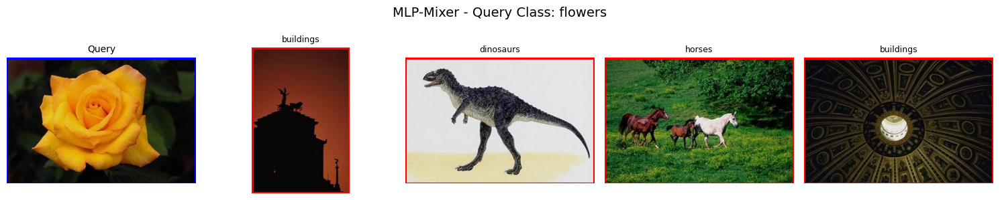

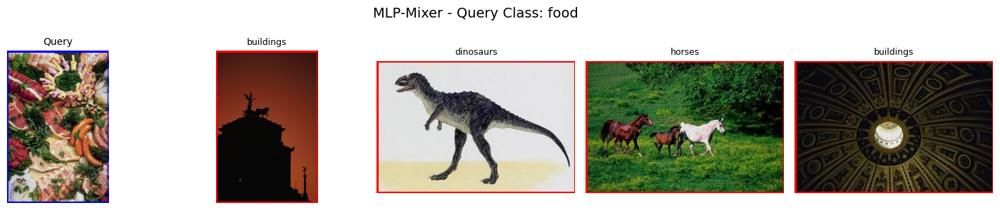

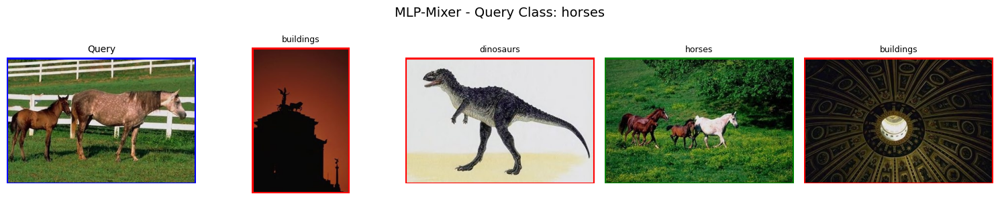

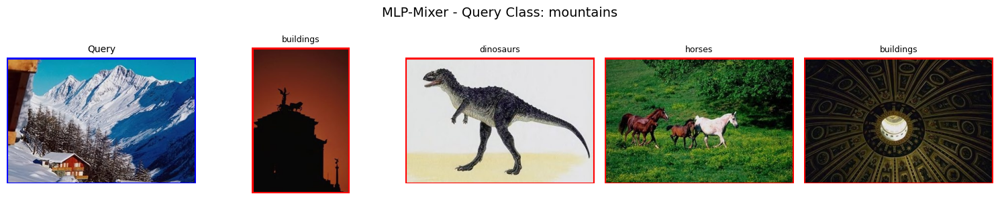

In [14]:
show_topk_cbir(mlp_mixer_features, labels, img_paths, top_k=4, model_name="MLP-Mixer")

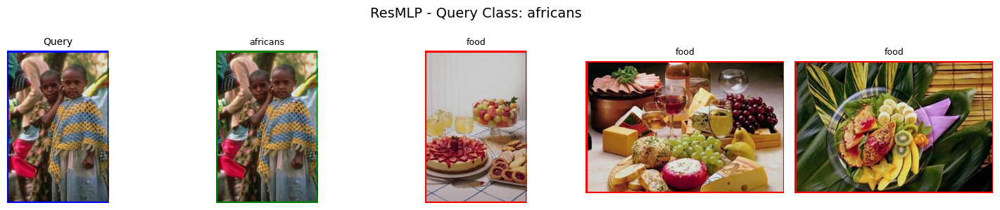

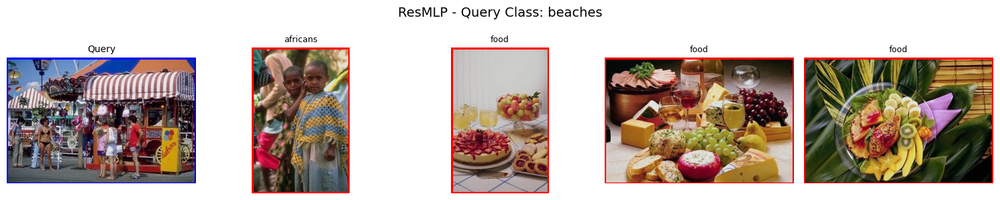

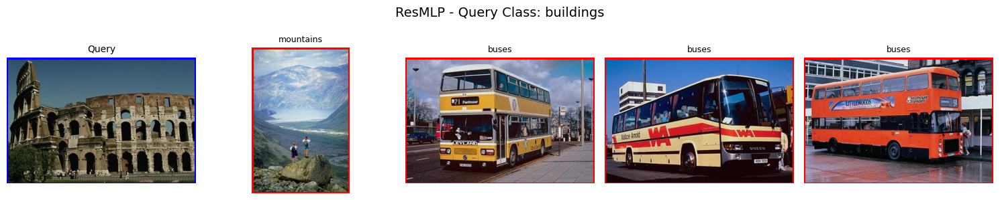

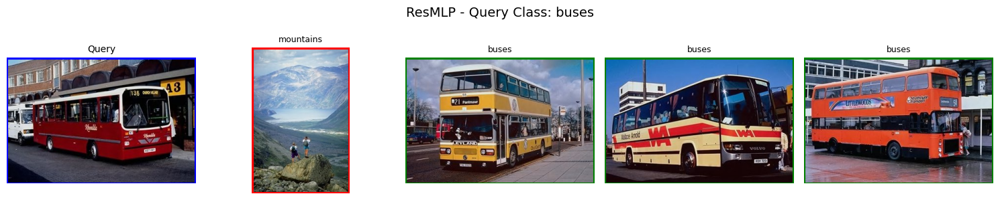

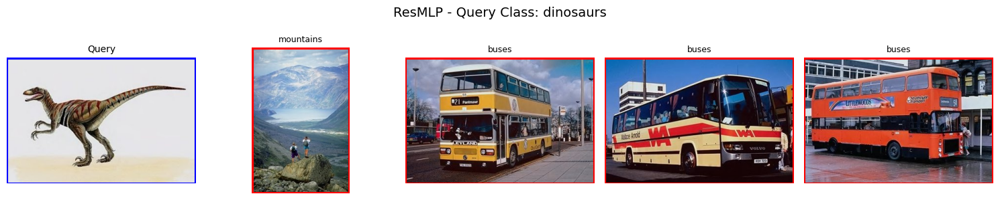

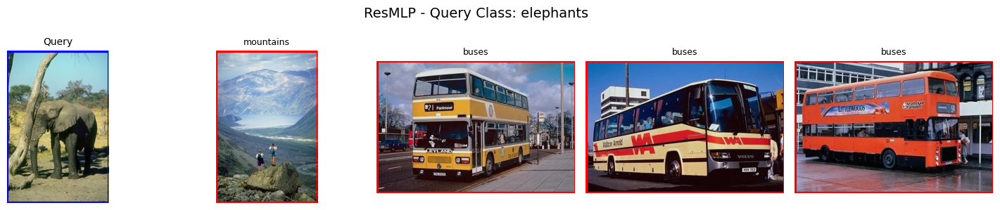

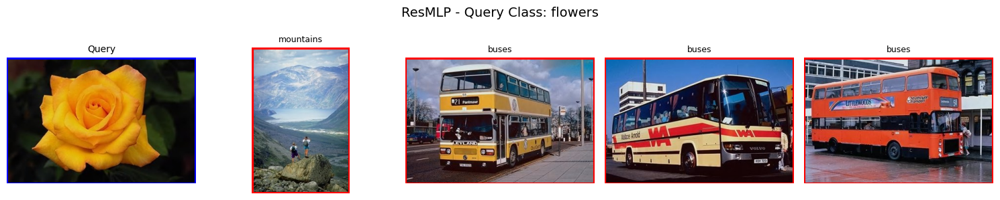

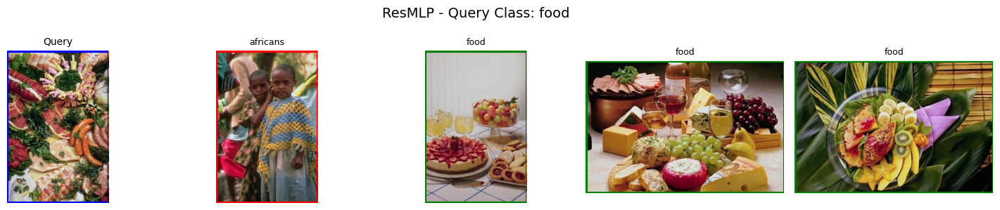

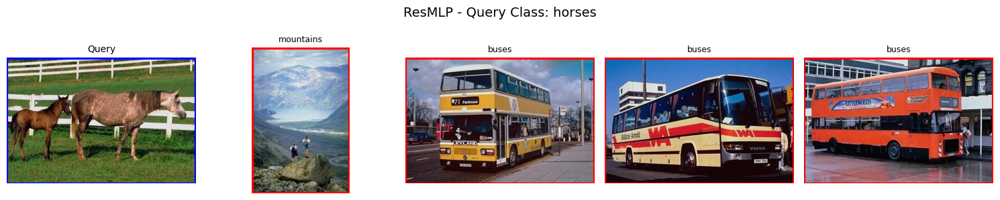

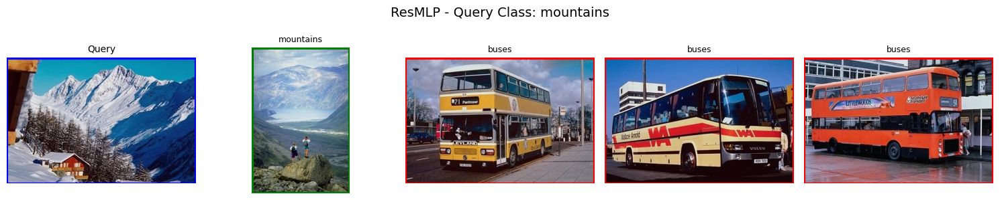

In [15]:
show_topk_cbir(resmlp_features, labels, img_paths, top_k=4, model_name="ResMLP")

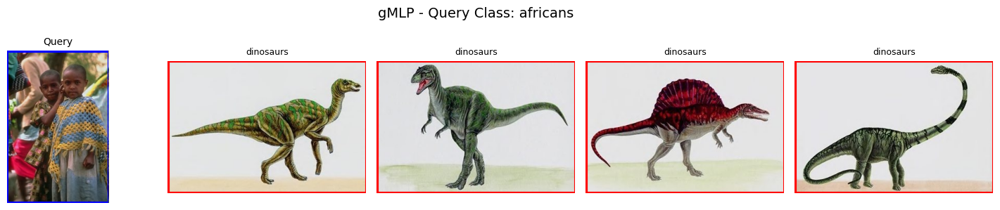

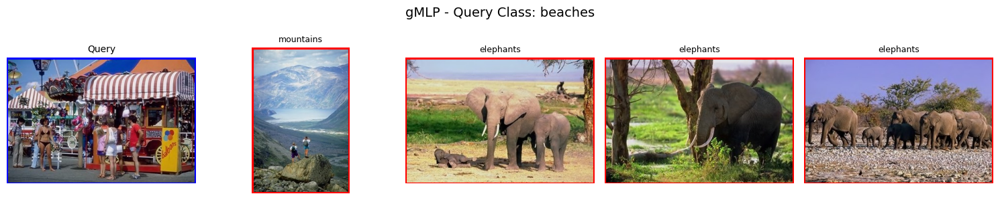

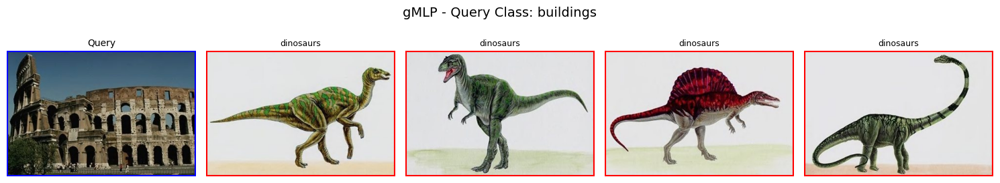

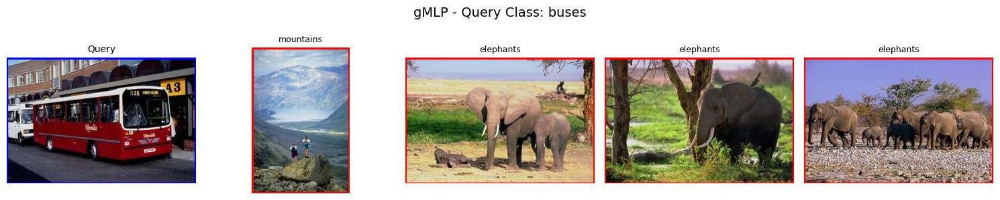

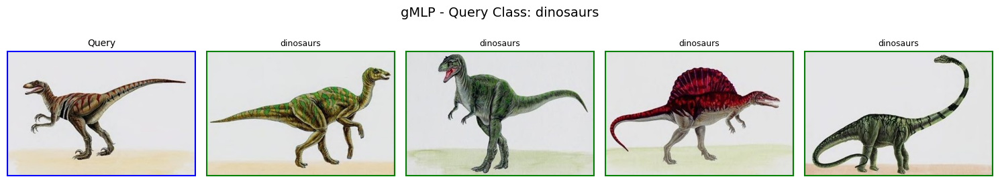

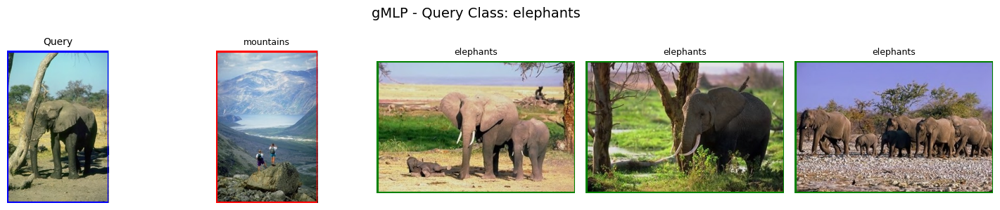

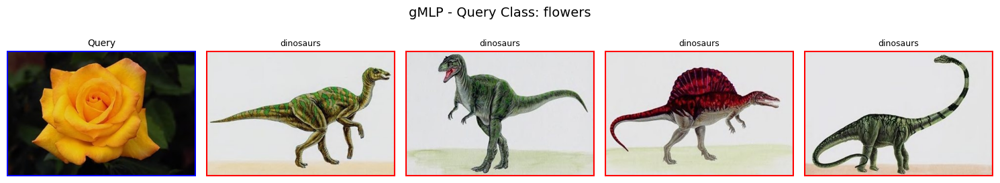

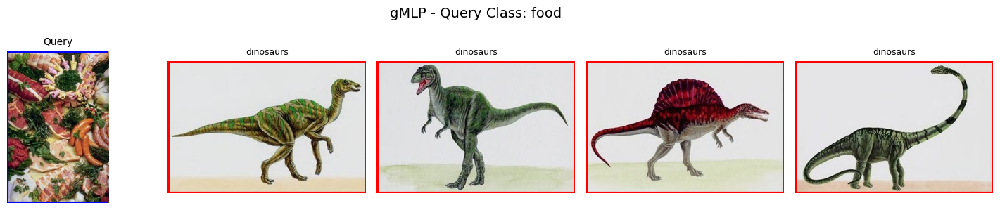

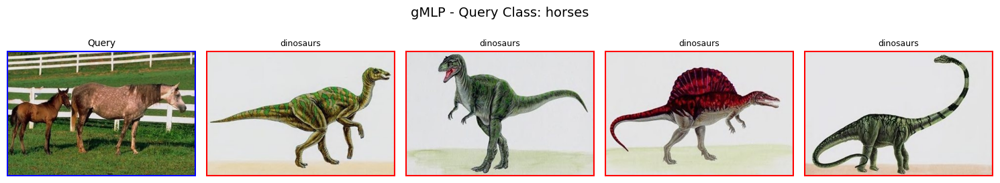

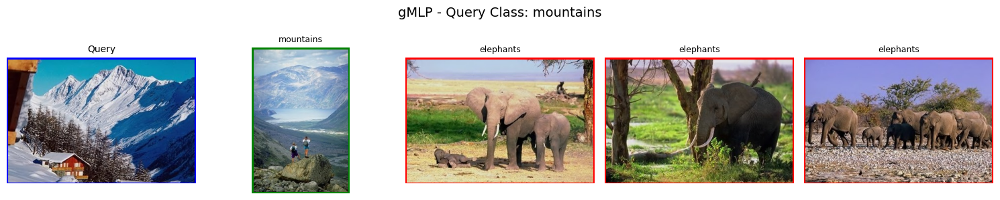

In [16]:
show_topk_cbir(gmlp_features, labels, img_paths, top_k=4, model_name="gMLP")